In [ ]:
#konlpy.tag 설치 / 텍스트 마이닝
!sudo apt-get install python3-dev; pip3 install konlpy


# window용 시각화 폰트 / 실행 후 런타임 재시작
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-dev is already the newest version (3.6.7-1~18.04).
python3-dev set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 42 not upgraded.
     |████████████████████████████████| 19.4 MB 1.3 MB/s 
     |████████████████████████████████| 448 kB 57.5 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 42 not upgraded.
Need to get 9,604 kB of archives.
After this operation, 29.5 MB of additional disk space will be used.
Get:1 http://archive.ub

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
#워드 클라우드 = 텍스트 마이닝
from wordcloud import WordCloud
from collections import Counter
from konlpy.tag import Okt
from PIL import Image

In [ ]:
# 한글 폰트 plt 적용
plt.rc('font', family='NanumBarunGothic')

In [ ]:
# 데이터 불러오기
df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Toy Project/데이터분석프로젝트_VER1_210329_210926.xlsx')

In [ ]:
df.head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
0,970634.0,504760.0,201435.0,ORDER,CANCELLED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-03-28 15:00:11,90500.0,NaN,NaN,110500.0,110500.0,NaN,VBANK,개발자 커리어,NaT
1,970650.0,432862.0,203178.0,ORDER,CANCELLED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:16:53,96000.0,NaN,NaN,116000.0,116000.0,NaN,CARD,영상 편집,2020-12-02
2,970657.0,72297.0,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810.0,[10% 할인] 시크릿코드 실무 완성편,19090.0,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
3,970656.0,72297.0,204246.0,ORDER,CANCELLED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810.0,NaN,NaN,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
4,970658.0,478028.0,201797.0,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,97500.0,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,20000.0,117500.0,117500.0,NaN,CARD,PPT/보고서,2019-11-14


#우리의 목표

- 패스트 캠퍼스의 베스트 셀러는?! -

[아래 주제들을 통해 "개인"의 실구매자의 니즈를 파악해보자]

# 대주제
- 6개월간 개인의 최다 판매 강의(카테고리, 서브 카테고리 등)를 통해 주력 상품을 파악하고 수익 극대화의 방향을 제시한다.

# 소주제
-  6개월 중 신청을 가장 많이 한 (sub)카테고리와 수강한 강의
- 카테고리 별(중요 x)
- 월별 최다 신청 강의 수
-- course_title 별 가장 많이 들은 과목(강의)
- 검색량과 강의의 상관관계(ing)
- 가장 많이 환불한 강의
- 개인 사용자들의 결제루트
- 쿠폰 사용자의 비율
-- 쿠폰 이용한 사용자의 결제수단은?
-- 쿠폰 사용하지 않은 사용자들의 결제수단은?
- 총 구매금액과 파레토 법칙
- 재구매한 사람은 얼마나 있을까?
- 항목 별 시각화
- 텍스트 마이닝



#데이터 전처리

✅ ORDER drop : 기밀

✅ tax_free_amount : 중복값

✅ coupon_discount_amount = NaN 값은 0으로 통일

✅ id 5396 Drop : (다른 데이터 전처리하면서 제거됨)

✅ B2B, B2G : 주제와 다른 데이터임

✅ format : NaN값 제거 (데이터 파악해본 결과 

✅ state : Pending, Hidden, Cancelled, Delete 제거 : 기밀



# 데이터 분류
데이터 타입을 알아보자

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105419 entries, 0 to 105418
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      105419 non-null  float64       
 1   customer_id             105416 non-null  float64       
 2   course_id               100212 non-null  float64       
 3   type                    105419 non-null  object        
 4   state                   105419 non-null  object        
 5   course_title            105403 non-null  object        
 6   category_title          105395 non-null  object        
 7   format                  105403 non-null  object        
 8   completed_at            105419 non-null  datetime64[ns]
 9   transaction_amount      105419 non-null  float64       
 10  coupon_title            31817 non-null   object        
 11  coupon_discount_amount  31817 non-null   float64       
 12  sale_price              104291

기초 통계량도 확인해보자

In [ ]:
df.describe()

,id,customer_id,course_id,transaction_amount,coupon_discount_amount,sale_price,tax_free_amount
count,1.054190e+05,105416.000000,100212.000000,1.054190e+05,3.181700e+04,1.042910e+05,1.042910e+05
mean,1.147054e+06,417248.252742,203868.586327,1.464814e+05,4.972172e+04,1.610808e+05,1.575551e+05
std,1.125898e+05,206414.496648,1534.583331,7.195061e+05,5.624467e+04,3.955298e+05,3.898133e+05
min,5.679930e+05,16.000000,2516.000000,-4.144074e+06,0.000000e+00,1.000000e+00,0.000000e+00
25%,1.048940e+06,256401.000000,203100.000000,8.350000e+04,2.000000e+04,1.090000e+05,1.090000e+05
50%,1.135186e+06,501046.000000,203787.000000,1.175000e+05,2.100000e+04,1.320000e+05,1.320000e+05
75%,1.240472e+06,566595.000000,204775.000000,1.590000e+05,6.915000e+04,1.710000e+05,1.710000e+05
max,1.381657e+06,672308.000000,207742.000000,1.134000e+08,2.000000e+06,9.094000e+07,9.094000e+07


결측값을 알아보자

In [ ]:
df.isna().sum()

id                            0
customer_id                   3
course_id                  5207
type                          0
state                         0
course_title                 16
category_title               24
format                       16
completed_at                  0
transaction_amount            0
coupon_title              73602
coupon_discount_amount    73602
sale_price                 1128
tax_free_amount            1128
pg                        15075
method                    13096
subcategory_title         19829
marketing_start_at        17979
dtype: int64

결측값 비율

In [ ]:
df.isna().sum() / df.shape[0] * 100

id                         0.000000
customer_id                0.002846
course_id                  4.939337
type                       0.000000
state                      0.000000
course_title               0.015178
category_title             0.022766
format                     0.015178
completed_at               0.000000
transaction_amount         0.000000
coupon_title              69.818534
coupon_discount_amount    69.818534
sale_price                 1.070016
tax_free_amount            1.070016
pg                        14.300079
method                    12.422808
subcategory_title         18.809702
marketing_start_at        17.054800
dtype: float64

In [ ]:
df.tail()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
105414,1364995.0,640697.0,205365.0,PAYMENT,CANCELLED,초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기,영상/3D,올인원,2021-09-25 14:10:42,96000.0,[WELCOME] 온라인 강의 2만원 할인쿠폰,20000.0,116000.0,116000.0,INICIS,TRANS,영상 편집,2021-06-15
105415,1364998.0,670896.0,204159.0,PAYMENT,CANCELLED,부동산 디벨로퍼 아카데미 : 인허가,부동산/금융,올인원,2021-09-25 14:16:33,189000.0,NaN,NaN,189000.0,189000.0,INICIS,CARD,부동산 개발,2021-02-10
105416,1364996.0,640697.0,205365.0,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기,영상/3D,올인원,2021-09-25 14:17:41,96000.0,[WELCOME] 온라인 강의 2만원 할인쿠폰,20000.0,116000.0,116000.0,INICIS,VBANK,영상 편집,2021-06-15
105417,1365005.0,670896.0,204159.0,PAYMENT,CANCELLED,부동산 디벨로퍼 아카데미 : 인허가,부동산/금융,올인원,2021-09-25 14:19:56,189000.0,NaN,NaN,189000.0,189000.0,INICIS,CARD,부동산 개발,2021-02-10
105418,1365007.0,610626.0,206720.0,PAYMENT,COMPLETED,용호수의 돈 버는 실전 영상 제작,영상/3D,올인원,2021-09-25 14:25:47,139000.0,[WELCOME] 온라인 강의 3만원 할인쿠폰,30000.0,169000.0,169000.0,NAVER,POINT,영상 편집,2021-08-17


# 데이터 전처리

### 불 필요한 컬럼 지우기

In [ ]:
df.columns

Index(['id', 'customer_id', 'course_id', 'type', 'state', 'course_title',
       'category_title', 'format', 'completed_at', 'transaction_amount',
       'coupon_title', 'coupon_discount_amount', 'sale_price',
       'tax_free_amount', 'pg', 'method', 'subcategory_title',
       'marketing_start_at'],
      dtype='object')

(tax_free_amount)

transaction_amount 값과 동일하여 삭제

In [ ]:
df = df[['id', 'customer_id', 'course_id', 'type', 'state', 'course_title', 'category_title', 
    'format', 'completed_at', 'transaction_amount','coupon_title', 'coupon_discount_amount', 'sale_price', 
    'pg', 'method', 'subcategory_title', 'marketing_start_at']]

### 비공개 데이터 제외

In [ ]:
# 아래(ORDER) 코드로 동일하게 하려 했으나 Cannot mask with non-boolean array containing NA / NaN values 오류가 발생하여 구글링 해본 결과
# 정규식의 na = False라는 결측치에 대해서 True로 볼지, False로 볼지 선택하는 파라미터, 결측값이 있는 경우 False
# case는 대소문자 구분(False 시 관계없이 다 포함)

order_drop = df[df['type'].str.contains('ORDER')].index
df.drop(order_drop, inplace=True)

# state 컬럼의 비공개 값 제거
df3 = df[~df['state'].str.contains('PENDING', na=False, case=False)] # 첫 df라서 df3이 안들어감
df3 = df3[~df3['state'].str.contains('CANCELLED', na=False, case=False)] # state - Cancelled 항목 제거
df3 = df3[~df3['state'].str.contains('DELETED', na=False, case=False)] # state - Deleted 항목 제거

df3 = df3[~df3['format'].str.contains('관리', na=False, case=False)] # format - 관리 항목 제거 
df3 = df3[~df3['format'].str.contains('B2B', na=False, case=False)] # format - B2B 항목 제거
df3 = df3[~df3['format'].str.contains('B2B 온라인', na=False, case=False)] # format - B2B 온라인 항목 제거
df3 = df3[~df3['format'].str.contains('B2G', na=False, case=False)] # format - B2G 항목 제거
df3 = df3[df3['sale_price'] != 1] # sale_price 1 아닌 숫자 출력 (스쿨, 스쿨 온라인 테스트 값)

전처리 값 확인

### 결측값 통일

In [ ]:
# coupon_discount_amout NaN 값을 0으로 통일

df3['coupon_discount_amount'].fillna(0, inplace=True)
df3.isna().sum()

id                            0
customer_id                   3
course_id                  2159
type                          0
state                         0
course_title                  4
category_title                7
format                        4
completed_at                  0
transaction_amount            0
coupon_title              29920
coupon_discount_amount        0
sale_price                  112
pg                         8139
method                        4
subcategory_title          7215
marketing_start_at         7910
dtype: int64

In [ ]:
# format NaN값인 것 제거 -> 확인 할 수 없는 값들
df3.dropna(subset=['format'], inplace=True)
df3.isna().sum()

id                            0
customer_id                   0
course_id                  2155
type                          0
state                         0
course_title                  0
category_title                3
format                        0
completed_at                  0
transaction_amount            0
coupon_title              29916
coupon_discount_amount        0
sale_price                  108
pg                         8135
method                        4
subcategory_title          7211
marketing_start_at         7906
dtype: int64

In [ ]:
# 결측치 확인
df3['format'].value_counts()

올인원        46554
RED         3383
온라인 완주반     1673
하루10분컷      1371
스쿨 온라인       398
스쿨            89
이벤트           89
아카이브          35
캠프            25
MBA           23
온라인            1
Name: format, dtype: int64

# 데이터 시각화

### 6개월 중 신청을 가장 많이 한 카테고리(수강한 강의)

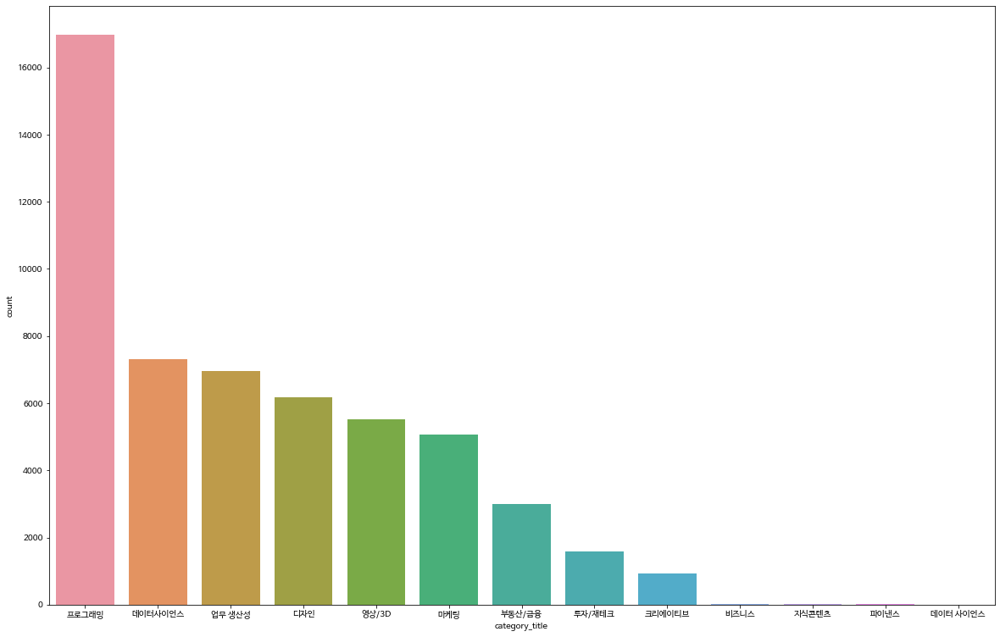

In [ ]:
# category_title 별 갯수 시각화
plt.figure(figsize=(20,13))
sns.countplot( x = df3['category_title'], order = df3['category_title'].value_counts().index)

6개월 중 프로그래밍이 압도적으로 많다.

2위는 데이터 사이언스

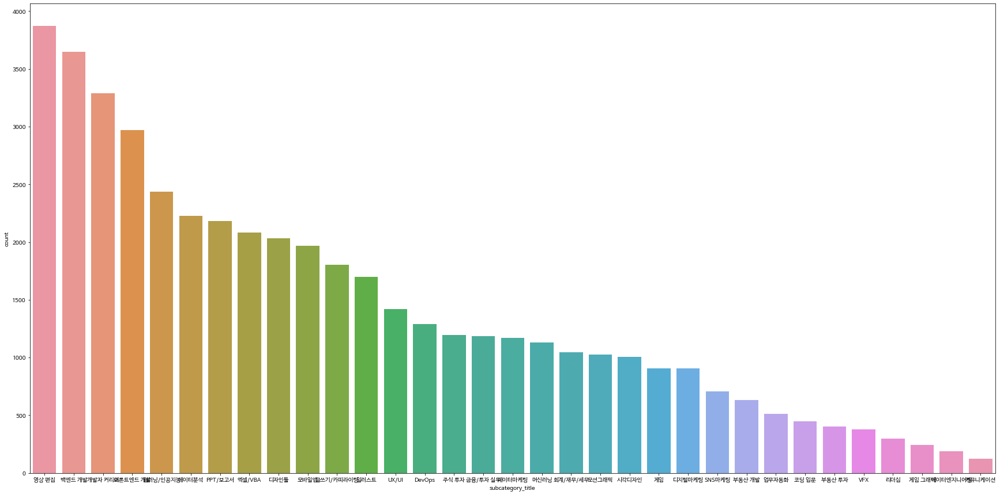

In [ ]:
# subcategory_title 별 갯수 시각화
plt.figure(figsize=(30,15))
sns.countplot( x = df3['subcategory_title'], order = df3['subcategory_title'].value_counts().index)

영상 편집과 백엔드 개발 순으로 비율이 높다

### 카테고리 별

In [ ]:
df3[['category_title', 'subcategory_title']].value_counts().to_frame()

0
category_title subcategory_title      
영상/3D          영상 편집              3871
프로그래밍          백엔드 개발             3649
               개발자 커리어            3289
               프론트엔드 개발           2972
데이터사이언스        딥러닝/인공지능           2436
               데이터분석              2227
업무 생산성         PPT/보고서            2184
               엑셀/VBA             2084
디자인            디자인툴               2035
프로그래밍          모바일앱               1968
마케팅            글쓰기/카피라이팅          1801
디자인            일러스트               1701
               UX/UI              1421
프로그래밍          DevOps             1288
투자/재테크         주식 투자              1194
부동산/금융         금융/투자 실무           1187
마케팅            데이터마케팅             1168
데이터사이언스        머신러닝               1130
부동산/금융         회계/재무/세무           1045
영상/3D          모션그래픽              1024
디자인            시각디자인              1008
프로그래밍          게임                  907
마케팅            디지털마케팅              904
               SNS마케팅              705
부동산/금융         부동산 개발              633
업무 생산성         업무자동화               514
프로그래밍          코딩 입문               449
투자/재테크         부동산 투자              403
영상/3D          VFX                 379
업무 생산성         리더십                 296
영상/3D          게임 그래픽              245
데이터사이언스        데이터엔지니어링            190
업무 생산성         커뮤니케이션              123

In [ ]:
df3.groupby('format').count()

,id,customer_id,course_id,type,state,course_title,category_title,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,pg,method,subcategory_title,marketing_start_at
format,,,,,,,,,,,,,,,,
MBA,23,23,23,23,23,23,23,23,23,1,23,23,22,23,0,23
RED,3383,3383,3383,3383,3383,3383,3383,3383,3383,267,3383,3383,3036,3383,3383,3247
스쿨,89,89,89,89,89,89,89,89,89,0,89,10,0,89,0,84
스쿨 온라인,398,398,398,398,398,398,398,398,398,92,398,398,328,398,0,132
아카이브,35,35,35,35,35,35,35,35,35,23,35,35,35,35,0,35
온라인,1,1,0,1,1,1,0,1,1,0,1,1,0,1,0,0
온라인 완주반,1673,1673,1673,1673,1673,1673,1673,1673,1673,865,1673,1672,1359,1673,0,1654
올인원,46554,46554,44400,46554,46554,46554,46552,46554,46554,22359,46554,46526,39266,46550,43028,39087
이벤트,89,89,89,89,89,89,89,89,89,0,89,89,89,89,0,79


### 월별 신청 강의 수

In [ ]:
#df_month = df['completed_at'].dt.strftime('/%m') 월별 코드

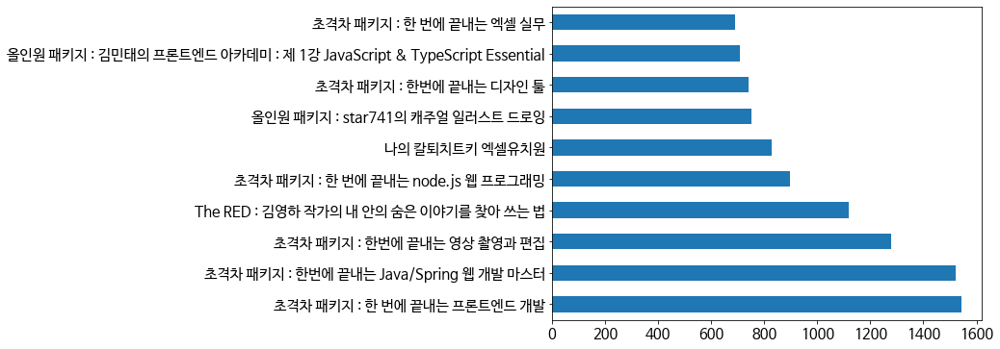

In [ ]:
# 6개월간 베스트 셀러 강의는?
df4 = df3.loc[ : , ['course_title', 'state', 'completed_at']]

df5 = df4.sort_values(by="completed_at")
df_date = df5.set_index(['completed_at'])
df_month = df_date.loc['2021-03-28':'2021-09-30']

month = pd.value_counts(df_month['course_title'], sort = True, ascending = False).head(10)
month.plot.barh(figsize = (8, 6), fontsize = 15)


1. 프론트 엔드 개발

2. 웹 개발

3. 영상 편집

- 1,2번은 웹 개발 구현에 대한 수요가 높다는 것을 알 수 있다.
- 3번은 전업 Youtuber의 증가와 Youtube를 통해 수익 파이프라인을 추가하려는 시도가 늘어났음을 알 수 있다.

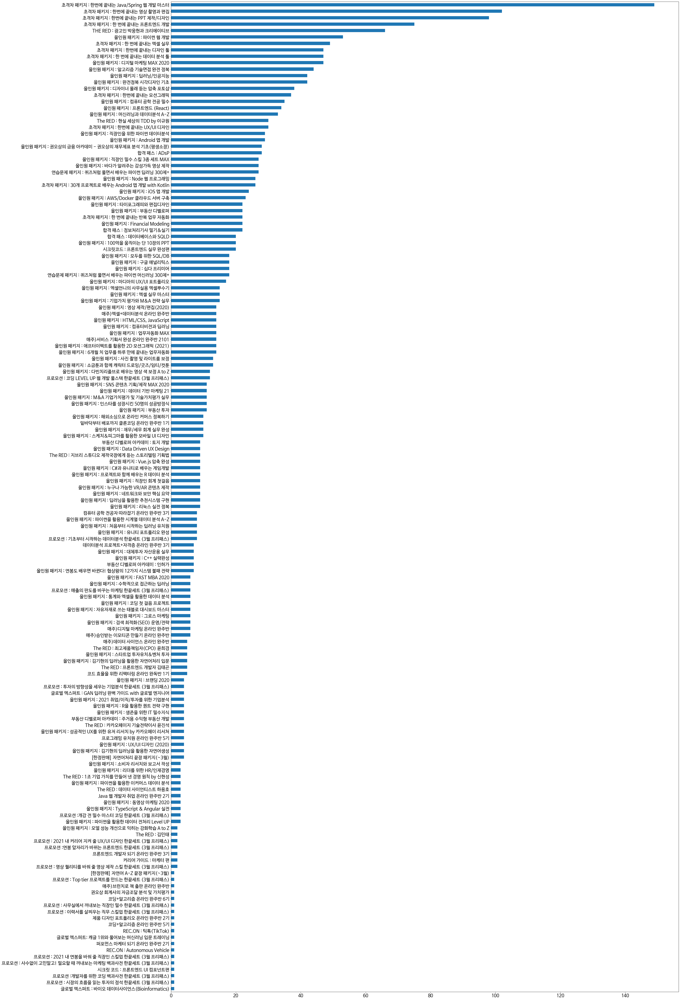

In [ ]:
# 3월  ==> 총 강의 수 : 852 개

df_date = df5.set_index(['completed_at'])
df_march = df_date.loc['2021-03-28':'2021-03-31']

march = pd.value_counts(df_march['course_title'].values, sort = True, ascending = True)
march.plot.barh(figsize = (40, 80), fontsize = 20)

3월의 데이터 값이 28일부터 시작하여 다른 달보다 총 갯수가 적음을 알 수 있다.

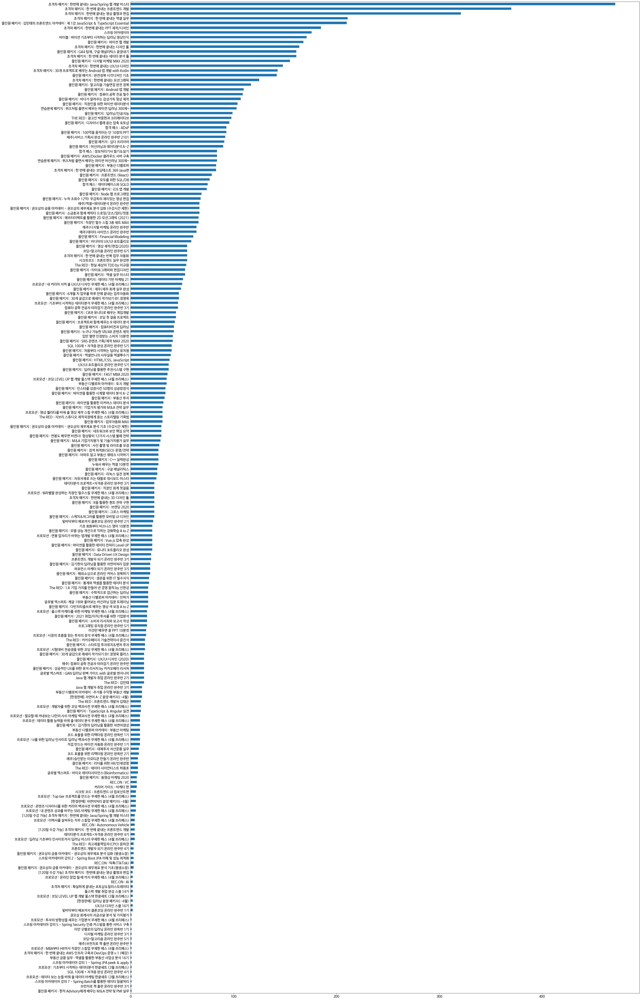

In [ ]:
# 4월  ==> 총 강의 수 : 7950 개

df_date = df5.set_index(['completed_at'])
df_april = df_date.loc['2021-04-01':'2021-04-30']

april = pd.value_counts(df_april['course_title'].values, sort = True, ascending = True)
april.plot.barh(figsize = (40, 80), fontsize = 15)

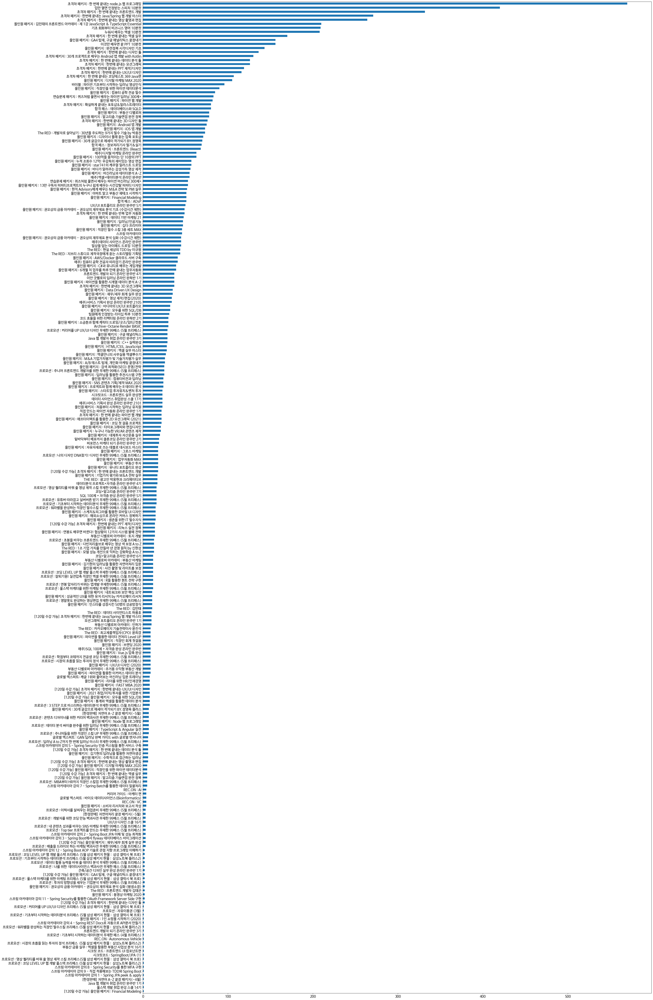

In [ ]:
# 5월  ==> 강의 수 : 7640 개

df_date = df5.set_index(['completed_at'])
df_may = df_date.loc['2021-05-01':'2021-05-31']

may = pd.value_counts(df_may['course_title'].values, sort = True, ascending = True)
may.plot.barh(figsize = (40, 80), fontsize = 15)

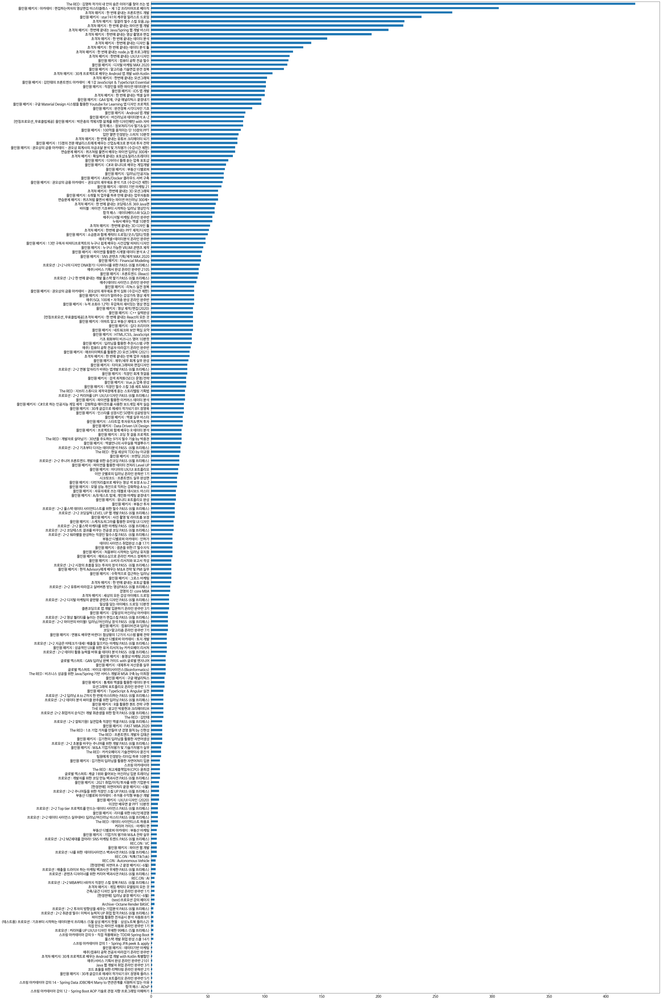

In [ ]:
# 6월  ===> 강의수 : 7772개

df_date = df5.set_index(['completed_at'])
df_june = df_date.loc['2021-06-01':'2021-06-30']

june = pd.value_counts(df_june['course_title'].values, sort = True, ascending = True)
june.plot.barh(figsize = (40, 80), fontsize = 15)

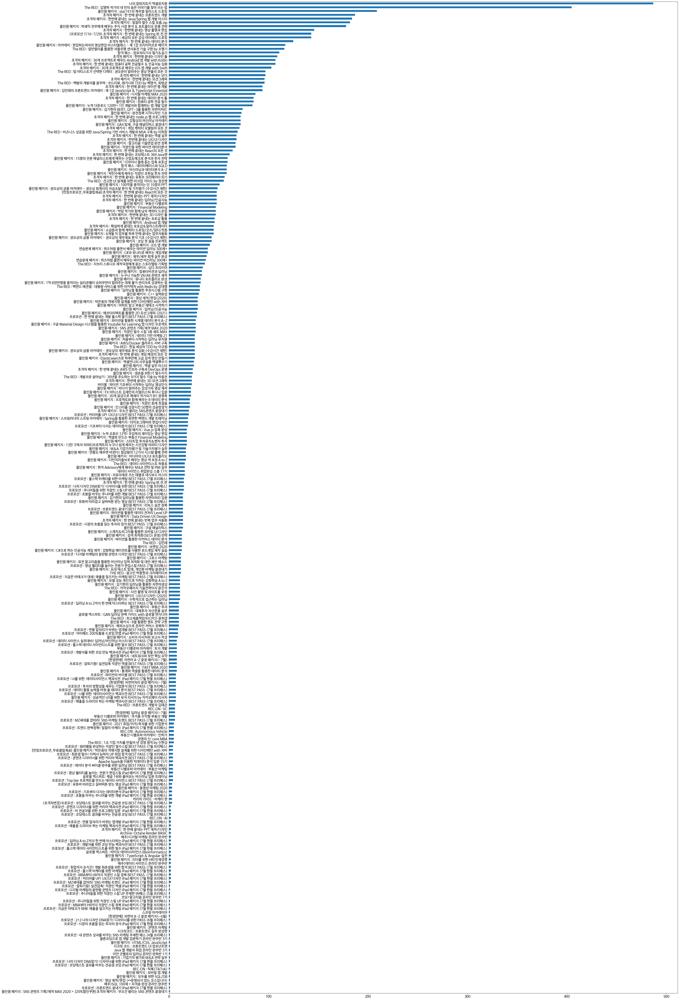

In [ ]:
# 7월 ===> 강의 수 : 7313 개

df_date = df5.set_index(['completed_at'])
df_july = df_date.loc['2021-07-01':'2021-07-31']

july = pd.value_counts(df_july['course_title'].values, sort = True, ascending = True)
july.plot.barh(figsize = (40, 80), fontsize = 15)

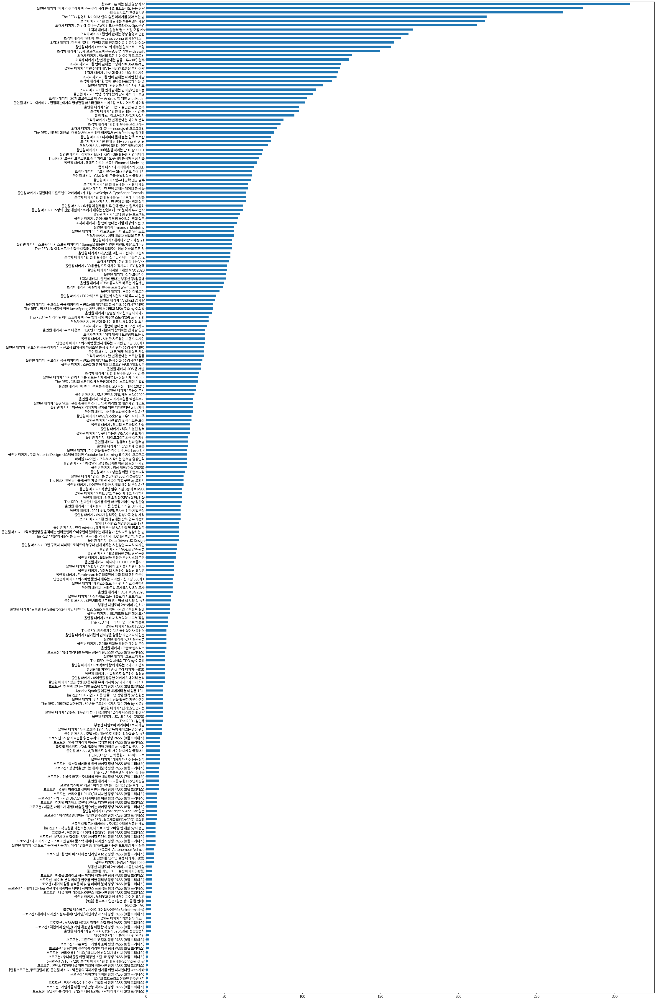

In [ ]:
# 8월 ===> 강의 수 : 7801 개

df_date = df5.set_index(['completed_at'])
df_aug = df_date.loc['2021-08-01':'2021-08-31']

aug = pd.value_counts(df_aug['course_title'].values, sort = True, ascending = True)
aug.plot.barh(figsize = (40, 80), fontsize = 15)

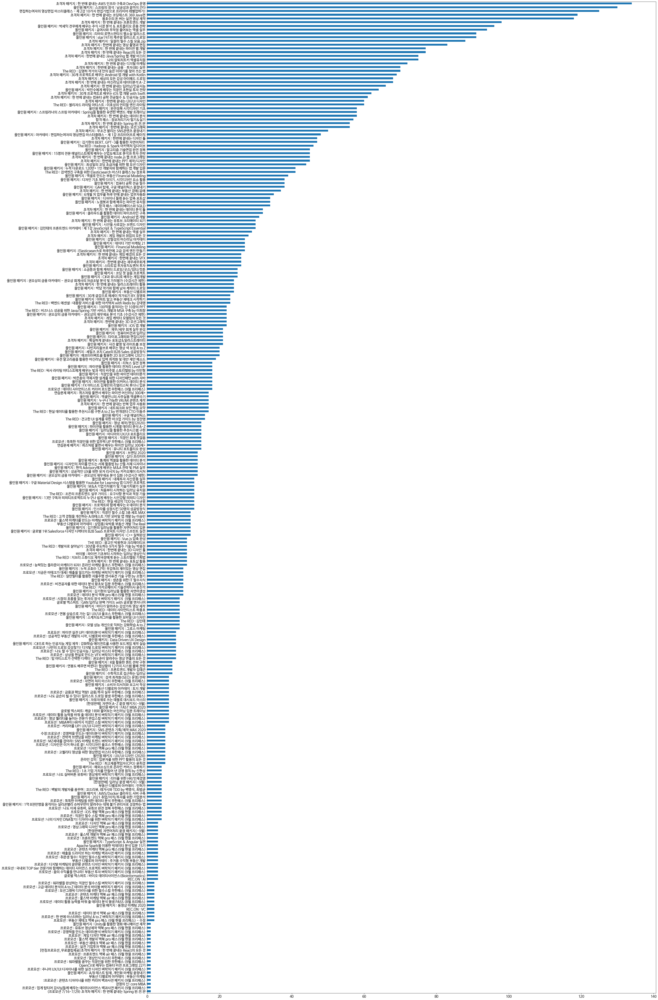

In [ ]:
# 9월 ===> 강의 수 : 5905개

df_date = df5.set_index(['completed_at'])
df_sept = df_date.loc['2021-09-01':'2021-09-30']

sept = pd.value_counts(df_sept['course_title'].values, sort = True, ascending = True)
sept.plot.barh(figsize = (40, 80), fontsize = 15)

### 검색량과 강의의 상관관계

In [ ]:
Nv_trends = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/datalab.xlsx')

<Figure size 1296x864 with 0 Axes>

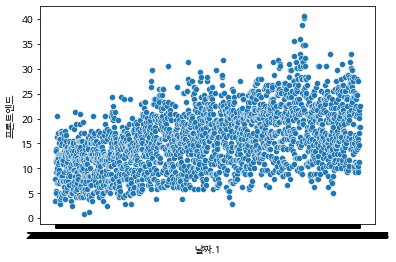

<Figure size 1296x864 with 0 Axes>

In [ ]:
trends = Nv_trends.loc[ : , ['날짜.1', '프론트엔드']]
trends
sns.scatterplot(x='날짜.1', y='프론트엔드', data=Nv_trends)
plt.figure(figsize = (18,12))

### 가장 많이 환불한 강의는?

In [ ]:
# 가장 많이 환불한 강의(명)
df3[['type','course_title']].head()
refund_title = df3[(df3['type']=='REFUND') & (df3['course_title'])]

# 프레임화
refund_title['course_title'].value_counts().to_frame("가장 많이 환불한 강의 개수").head(10)

,가장 많이 환불한 강의 개수
초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,121
초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,105
초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍,68
올인원 패키지 : star741의 캐주얼 일러스트 드로잉,65
초격차 패키지 : 한번에 끝내는 디자인 툴,64
초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,63
초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,61
The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,57
올인원 패키지 : 아카데미 : 편집하는여자의 영상편집 마스터클래스 - 제 1강 프리미어프로 베이직,55
올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & TypeScript Essential,53


수요가 많은 만큼 환불의 수가 높은 것으로 보인다.

다만 영상 편집의 환불값은 프론트 엔드에 비해 적은 것으로 보아
만족도가 프론트엔드에 비해 높은 것을 알 수 있다.

### 개인 사용자들의 결제루트

결제 대행사

In [ ]:
# pg: nan -> 기타 pg

df3['pg'] = df3['pg'].replace(np.nan, '기타 pg')

In [ ]:
df3['pg'].value_counts().to_frame()

,pg
INICIS,28469
KAKAO,9637
기타 pg,8135
NAVER,4786
PAYCO,2459
CHAI,155


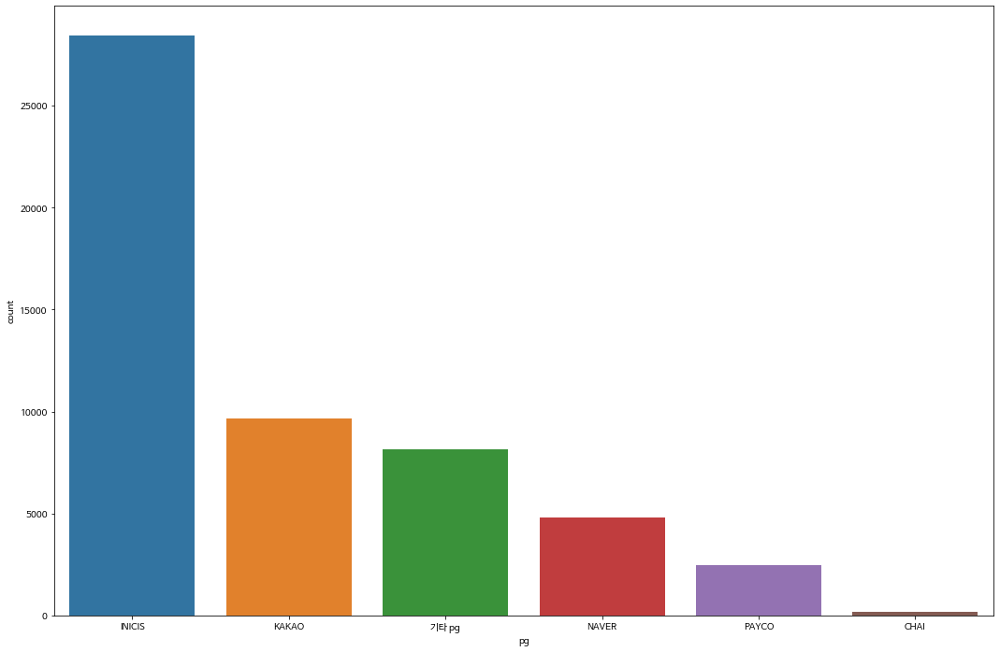

In [ ]:
# pg별 비율 시각화

fig = plt.figure(figsize = (18,12))
sns.countplot( x = df3['pg'], order = df3['pg'].value_counts().index)

함의 : INICIS 휴대폰, 신용카드 전자결제 전문기업으로서 시장 지배적 사업자이기 때문에 패캠 데이터 분석도 동일하게 나타난다.

결제 방식

In [ ]:
# method: nan -> 기타 method

df3['method'] = df3['method'].replace(np.nan, '기타 method')

df3['method'].value_counts().to_frame()

,method
CARD,37345
POINT,8035
PROMOTION,3499
VBANK,3254
TRANSFER,703
TRANS,679
ONSITE,117
VOUCHER,5
기타 method,4


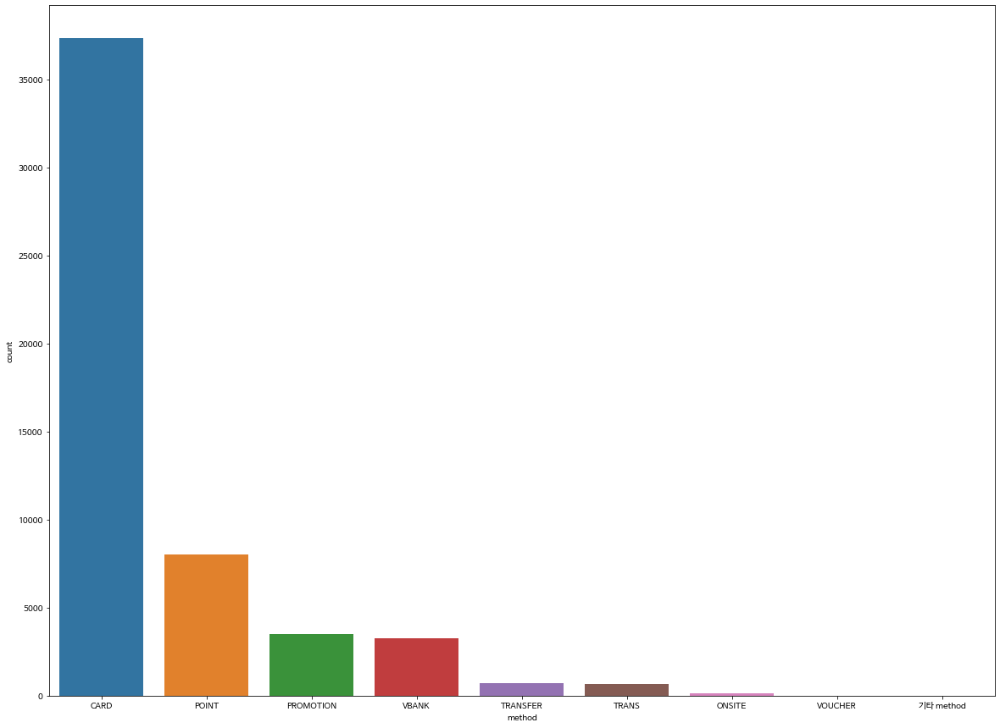

In [ ]:
# method별 비율 시각화

fig = plt.figure(figsize = (20,15))
sns.countplot( x = df3['method'], order = df3['method'].value_counts().index) 

함의 :우리의 통념과 동일하게 카드 결제가 압도적인 비율을 차지한다.

- 카드사, 이니시스와 원만한 협의를 통해 수수료를 줄이는 방향이 수익성 극대화에 도움이 될 것 이다.

### 쿠폰 사용자의 비율

Text(0.5, 1.0, ' 쿠폰 사용자 비율')

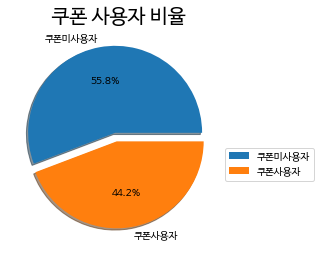

In [ ]:
coup_had = df3.loc[df3['coupon_discount_amount'] > 0, 'coupon_discount_amount'].count() # 쿠폰을 사용한 사람의 수
coup_not = df3.loc[df3['coupon_discount_amount'] == 0, 'coupon_discount_amount'].count() # 쿠폰을 사용하지 않은 사람의 수
pie_series = pd.Series([coup_not, coup_had], index = ['쿠폰미사용자', '쿠폰사용자'])
explode = pd.Series([0.05, 0.05], index = pie_series.index)
plt.pie(pie_series, labels = pie_series.index, autopct = '%.1f%%', shadow = True, explode = explode )
plt.legend(loc = (1, 0.3))
plt.title(' 쿠폰 사용자 비율', size = 20)

개인 구매자의 쿠폰 미사용자는 55.8%가 나왔다.

- 쿠폰 프로모션에 대한 홍보를 강화할 필요가 있다

Text(0, 0.5, '총구매액')

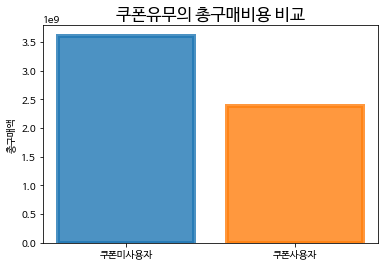

In [ ]:
coup_trans = df3.loc[df3['coupon_discount_amount'] > 0, 'transaction_amount'].sum() # 쿠폰사용자의 총구매비용(할인액 포함)
notcoup_trans = df3.loc[df3['coupon_discount_amount'] == 0, 'transaction_amount'].sum() # 쿠폰미사용자의 총구매비용
plt.bar(['쿠폰미사용자','쿠폰사용자'],[notcoup_trans, coup_trans], color = ['C0','C1'],edgecolor =  ['C0','C1'], alpha = 0.8, linewidth = 4)
plt.title('쿠폰유무의 총구매비용 비교', fontsize = 17)
plt.ylabel('총구매액')

평균 구매액 역시 쿠폰 미사용자가 높게 나왔다.
- 이또한 쿠폰 프로모션에 대한 홍보를 강화하여 총 이용자 비율을 높이는데 전념할 필요가 있음. 

In [ ]:
df3[df3['coupon_discount_amount'] == 0]['method'].value_counts().to_frame('쿠폰을 사용하지 않은 고객들의 결제 수단')

,쿠폰을 사용하지 않은 고객들의 결제 수단
CARD,22299
POINT,4639
VBANK,1753
TRANSFER,703
TRANS,384
ONSITE,117
PROMOTION,13
VOUCHER,5
기타 method,3


<BarContainer object of 9 artists>

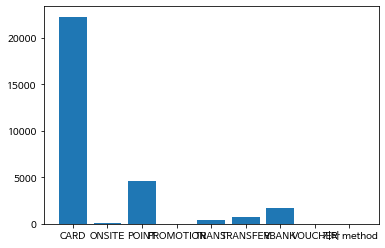

In [ ]:
plt.bar(df3[df3['coupon_discount_amount'] == 0]['method'].value_counts().sort_index().index, df3[df3['coupon_discount_amount'] == 0]['method'].value_counts().sort_index().values)

In [ ]:
df3[df3['coupon_discount_amount'] > 0]['method'].value_counts().to_frame('쿠폰을 사용한 고객들의 결제 수단')

,쿠폰을 사용한 고객들의 결제 수단
CARD,15046
PROMOTION,3486
POINT,3396
VBANK,1501
TRANS,295
기타 method,1


<BarContainer object of 6 artists>

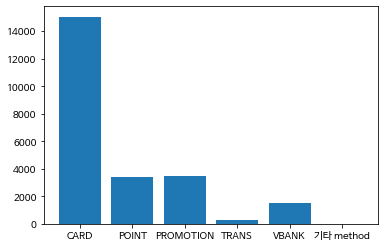

In [ ]:
plt.bar(df3[df3['coupon_discount_amount'] > 0]['method'].value_counts().sort_index().index, df3[df3['coupon_discount_amount'] > 0]['method'].value_counts().sort_index().values)

함의 : 상단의 결제루트와 동일하게 카드사와 협의하여 수수료를 낮춘다면 수익의 상승을 기대해볼 수 있다.

###  총 구매금액과 파레토 법칙

상위 20% vs 나머지 80% 이용 금액 비율

파레토 법칙 : 상위 20%가 전체 생산의 80%를 해낸다는 법칙
- 경제 이론에 이탈리아 경제학자 파레토가 착안한 ‘파레토 법칙’이 있다. 이는 소위 ‘8대2의 법칙’으로 통용되기도 한다. 가령, 백화점 매출의 80%는 20%의 단골손님이 매출을 일으키고, 오며 가며 들린 고객 80%가 20%의 매출을 일으킨다는 것이다.

In [ ]:
# df3 / transaction_amount 내림차순 정렬
df3.sort_values('transaction_amount', axis = 0, ascending = False,
               inplace = True, na_position = 'last')

In [ ]:
# 0 이상의 transaction_amount 값 출력 = 판매량(환불값 포함)
pay = df3[['transaction_amount','customer_id']]
pay.index.name = '고객id'
pay

,transaction_amount,customer_id
고객id,,
105129,1800000.0,175317.0
104864,1800000.0,669258.0
104110,1800000.0,161395.0
104582,1800000.0,178770.0
105021,1800000.0,15407.0
...,...,...
104891,-1800000.0,36427.0
47153,-1983330.0,141765.0
27321,-2512593.0,282430.0


In [ ]:
# customer_id를 기준으로 나눠 transaction_amount의 합이 얼마인지 확인
amount = df3.groupby('customer_id').sum()['transaction_amount'].sum()
# 총 판매량
print("총 수익은 ","{:,}" .format(int(amount)), "원 입니다.") 

총 수익은  5,993,539,748 원 입니다.


In [ ]:
# vip를 찾기 위해 transaction_amount 값이 큰 순서대로 출력되도록 내림차순 정렬
vip = df3.groupby('customer_id').sum()['transaction_amount'].sort_values(ascending = False)
vip_df = vip.to_frame()

# 실결제한 고객 중 상위 20%(7472.2 of 37361)에 해당하는 결제 금액
amount20 = vip_df.head(int(37361*0.2))['transaction_amount'].sum()
print('상위 20%의 결제 금액은',"{:,}" .format(int(amount20)),'원 입니다.')

상위 20%의 결제 금액은 2,982,740,101 원 입니다.


In [ ]:
amount80 = vip_df.tail(int(37361*0.8))['transaction_amount'].sum()
print('하위 80%의 결제 금액은',"{:,}" .format(int(amount80)),'원 입니다.')

하위 80%의 결제 금액은 2,819,422,003 원 입니다.


결론 = 파레토의 법칙은 적용되지 않으나 상위 20%가 절반 이상의 매출을 담당한다.

* int 함수로 인해 상위, 하위 값은 근삿값이다.

### 재구매한 사람이 얼마나 있을까?

In [ ]:
# customer_id 기준으로 내림차순 정렬(중복 값 확인 위함)
df3.sort_values('customer_id', axis = 0, ascending = True,
               inplace = True, na_position = 'last')

In [ ]:
# 중복되는 값만 보자

# regular = df3.customer_id.value_counts().loc[df3.customer_id.value_counts() > 1].index
# df3.loc[df3.customer_id.isin(regular)]

In [ ]:
# 최다 구매자 Top 10


pay_counts = pay['customer_id'].value_counts().rank(method='min', ascending=False).to_frame().head(10)
pay_counts['value_counts'] = pay['customer_id'].value_counts().to_frame().head(10)
pay_counts.columns = ['순위', '구매횟수']
pay_counts.index.name = '고객 ID'
pay_counts

,순위,구매횟수
고객 ID,,
98685.0,1.0,53
427973.0,2.0,47
158374.0,3.0,42
50769.0,4.0,41
3189.0,5.0,40
1189.0,6.0,37
40783.0,7.0,34
276705.0,8.0,32
106662.0,9.0,29


재구매자의 순위를 파악하고 싶었지만, 구매금액이 큰 고객과 구매횟수가 큰 고객의 customer_id가 일치하지 않는 것을 보고 더 자세히 들여다보았습니다.

In [ ]:
df3[df3['customer_id'] == 1189]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,pg,method,subcategory_title,marketing_start_at
고객id,,,,,,,,,,,,,,,,,
59441,1159373.0,1189.0,203328.0,PAYMENT,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-06-23 16:05:29,0.0,패캐머_온라인 쿠폰! (CRM팀),93600.0,93600.0,NaN,PROMOTION,디자인툴,2020-10-23 00:00:00
79967,1243450.0,1189.0,205423.0,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상 회계사의 자금조달 분석 및 가치...,부동산/금융,올인원,2021-07-26 17:19:11,0.0,패캐머_온라인 쿠폰! (CRM팀),300000.0,300000.0,NaN,PROMOTION,회계/재무/세무,NaT
14122,1013445.0,1189.0,204262.0,PAYMENT,COMPLETED,권오상 회계사의 자금조달 분석 및 가치평가,부동산/금융,캠프,2021-04-16 15:42:55,0.0,[무료수강권] 권오상 회계사의 자금조달 및 가치평가_내부 검수용,800000.0,800000.0,NaN,PROMOTION,NaN,NaT
70561,1204061.0,1189.0,203778.0,PAYMENT,COMPLETED,올인원 패키지 : 애프터이펙트를 활용한 2D 모션그래픽 (2021),영상/3D,올인원,2021-07-08 15:33:39,0.0,패캐머_온라인 쿠폰! (CRM팀),142500.0,142500.0,NaN,PROMOTION,모션그래픽,2020-05-08 00:00:00
104758,1360655.0,1189.0,205789.0,PAYMENT,COMPLETED,올인원 패키지 : FX 아티스트 김재민의 리얼리스틱 후디니 입문,영상/3D,올인원,2021-09-23 13:06:35,0.0,패캐머_온라인 쿠폰! (CRM팀),226000.0,226000.0,NaN,PROMOTION,VFX,2021-07-26 00:00:00
42755,1103491.0,1189.0,204342.0,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-05-28 11:33:39,0.0,패캐머_온라인 쿠폰! (CRM팀),100000.0,100000.0,NaN,PROMOTION,데이터마케팅,2021-04-02 00:00:00
51064,1128706.0,1189.0,203782.0,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 모션그래픽,영상/3D,올인원,2021-06-08 22:19:09,0.0,패캐머_온라인 쿠폰! (CRM팀),150000.0,150000.0,NaN,PROMOTION,모션그래픽,2021-01-22 00:00:00
94815,1314505.0,1189.0,206181.0,PAYMENT,COMPLETED,올인원 패키지 : 리마의 로맨스판타지 웹소설 일러스트,디자인,올인원,2021-08-30 11:41:30,0.0,패캐머_온라인 쿠폰! (CRM팀),174000.0,174000.0,NaN,PROMOTION,일러스트,2021-08-30 00:00:00
59870,1161261.0,1189.0,200681.0,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-06-24 13:35:58,0.0,패캐머_온라인 쿠폰! (CRM팀),127500.0,127500.0,NaN,PROMOTION,머신러닝,2019-05-17 00:00:00


이로부터 구매횟수에 내부 test case가 포함돼서 데이터 왜곡이 일어났음을 확인할 수 있었습니다.

(98685 고객님께 큰절..)

### 항목 별 시각화

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


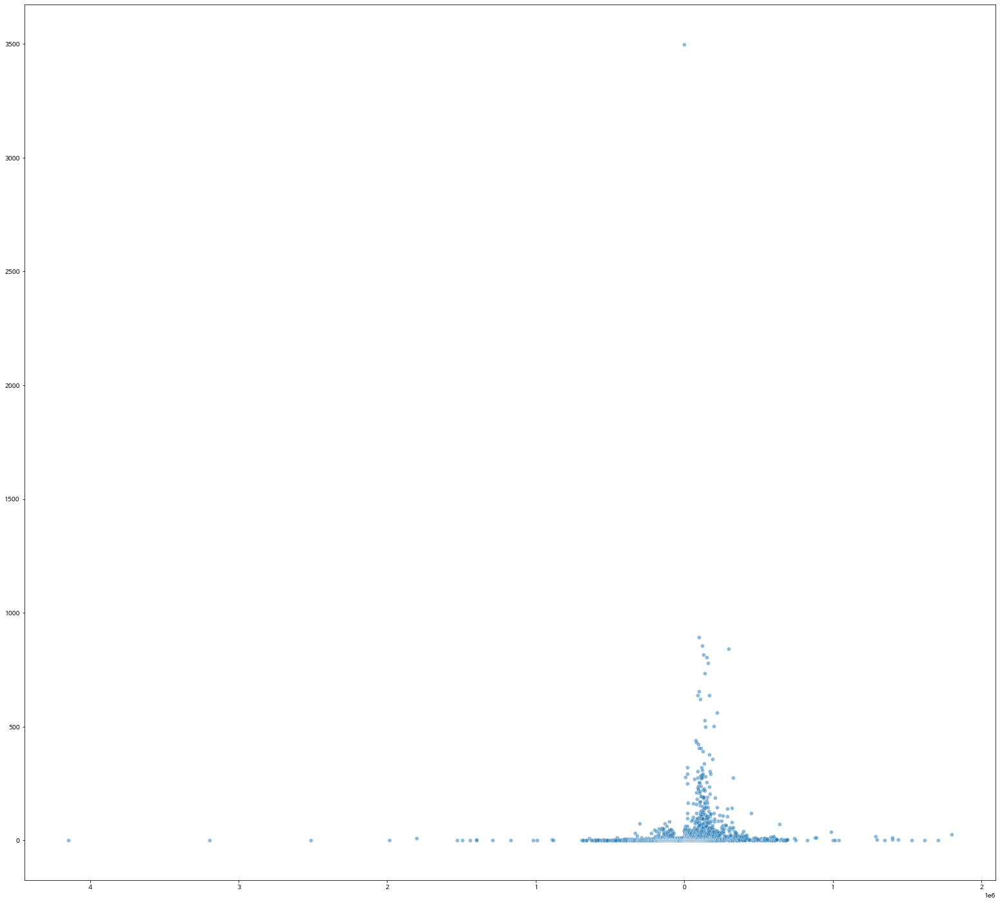

In [ ]:
# 결제 금액 분포도
plt.figure(figsize=(27,25))
sns.scatterplot(df3['transaction_amount'].value_counts().sort_index().index, df3['transaction_amount'].value_counts().sort_index().values, alpha = .5)
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


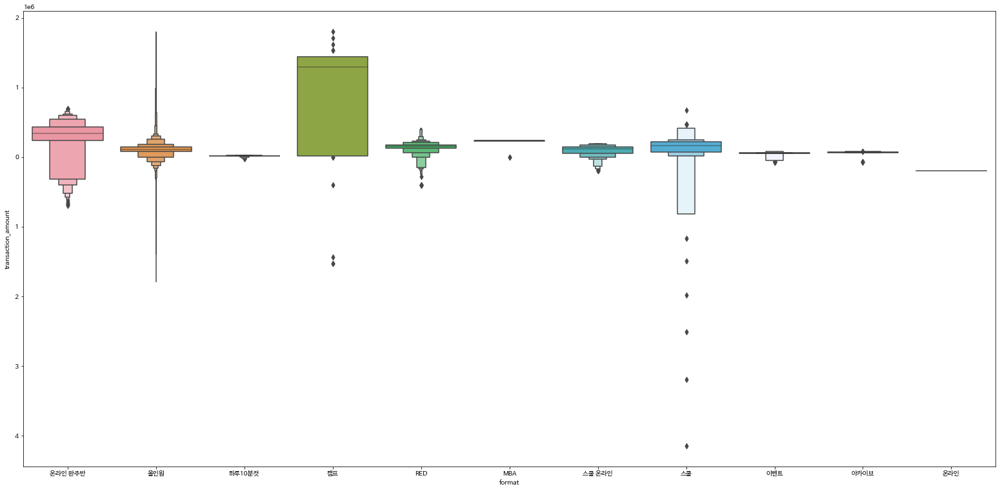

In [ ]:
# format 별 금액 비중
plt.figure(figsize=(27,13))
sns.boxenplot(x=df3['format'], y='transaction_amount', data=df3)

### 텍스트 마이닝

In [ ]:
text = ''.join(s for s in df3['course_title'])

okt = Okt()
nouns = okt.nouns(text) # 명사만 추출

words = [n for n in nouns if len(n) > 1] # 단어의 길이가 1개인 것은 제외

c = Counter(words) # 위에서 얻은 words를 처리하여 단어별 빈도수 형태의 딕셔너리 데이터를 구함

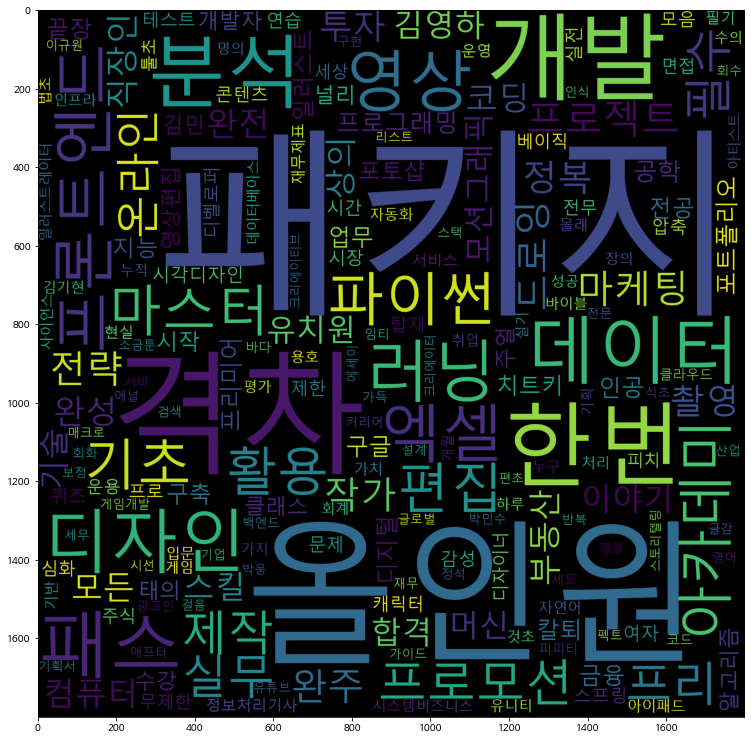

In [ ]:
# 폰트 추가 및 시각화
wc = WordCloud(font_path='/content/drive/MyDrive/Colab Notebooks/Toy Project/MALGUN.TTF', width=1800, height=1800, scale=1.0, max_font_size=500)
gen = wc.generate_from_frequencies(c)
plt.figure(figsize=(27,13))
plt.imshow(gen)

In [ ]:
df3['course_title'].to_frame()

,course_title
26466,코딩+알고리즘 온라인 완주반 6기
71084,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+
22871,올인원 패키지 : 딥러닝을 활용한 추천시스템 구현
2366,올인원 패키지 : 파이썬 웹 개발
104241,편집하는여자의 영상편집 마스터클래스 - 제 2강 10가지 편집기법으로 프리미어 레벨...
...,...
105381,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기"
105397,올인원 패키지 : 노잼봇과 함께 배우는 파이썬 유치원
105395,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin
105403,올인원 패키지 : 컴퓨터 공학 전공 필수


In [ ]:
text = text.replace('올인원','').replace('패키지','').replace('프로모션','').replace('온라인','').replace('초격차','')

In [ ]:
okt = Okt()
nouns = okt.nouns(text) # 명사만 추출

words = [n for n in nouns if len(n) > 1] # 단어의 길이가 1개인 것은 제외

c = Counter(words) # 위에서 얻은 words를 처리하여 단어별 빈도수 형태의 딕셔너리 데이터를 구함

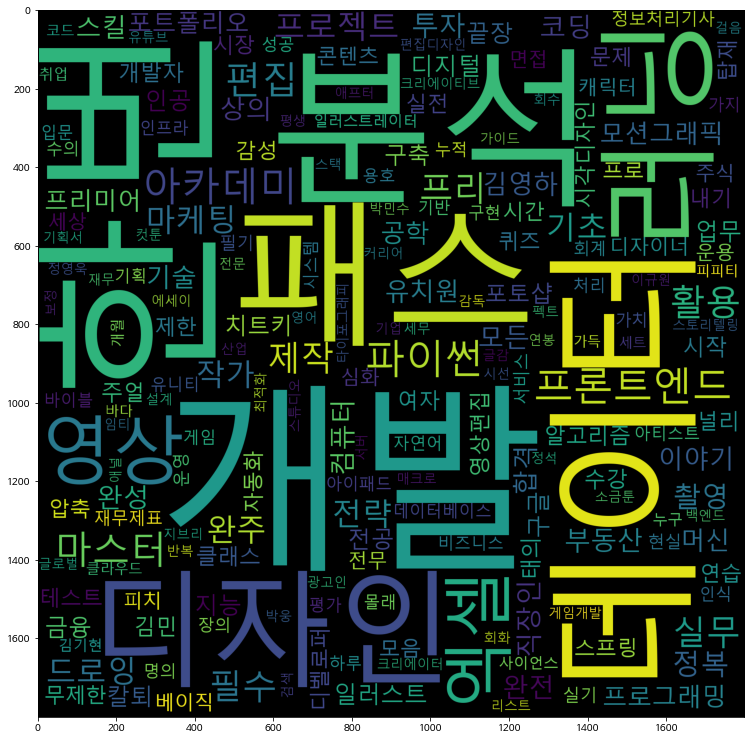

In [ ]:
wc = WordCloud(font_path='/content/drive/MyDrive/Colab Notebooks/Toy Project/MALGUN.TTF', width=1800, height=1800, scale=1.0, max_font_size=500)
gen = wc.generate_from_frequencies(c)
plt.figure(figsize=(27,13))
plt.imshow(gen)

- 가장 많이 선택받은 강의 키워드

pyplot과 seaborn 이외에 다른 시각화 모듈을 찾다가 텍스트 마이닝을 찾아보았음

# 결론


개인 이용자의 비중을 늘리고 싶다면

1. 쿠폰 사용 비중을 늘리고 홍보를 많이 하여 총 금액을 늘리는 방향
2. 파레토 법칙이 미성립함을 보아 vip를 모집하기 위한 인센티브가 필요함
3. 이니시스와 카드사와 협의하여 수수료를 줄이는 방향
4. 사회적 이슈, 트렌드와 같은 방향의 질 좋은 강의가 필요함
- ex) 영상편집, 프론트엔드